# DDL vs MPI Comparison

Compares column ordinal positions and data types from the DDL definitions CSV against the Legacy MPI database (`DWH_CUAL.dbo`). Shows mismatches and generates a corrected CSV.

In [0]:
%run /Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/default_utility_functions

In [0]:
import re
import csv
import io
from pyspark.sql import Row
from pyspark.sql.types import StructType, StructField, StringType, IntegerType

# Read the CSV file
csv_path = '/Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/match_and_update_ddl/definitions (1).csv'

with open(csv_path, 'r') as f:
    reader = csv.DictReader(f)
    csv_rows = list(reader)

print(f"Total tables in CSV: {len(csv_rows)}")
print(f"CSV columns: {csv_rows[0].keys() if csv_rows else 'empty'}")

# Parse DDL to extract column name, ordinal position, and data type
def parse_ddl(ddl_text):
    """Parse CREATE TABLE DDL to extract columns with ordinal position and data type."""
    columns = []
    # Find the content between first ( and last ) that contains column definitions
    match = re.search(r'CREATE TABLE.*?\((.+?)\)\s*(?:USING|$)', ddl_text, re.DOTALL | re.IGNORECASE)
    if not match:
        return columns
    
    col_block = match.group(1)
    ordinal = 0
    for line in col_block.strip().split('\n'):
        line = line.strip().rstrip(',')
        if not line:
            continue
        # Match column definition: column_name DATA_TYPE(precision,scale) or column_name DATA_TYPE
        col_match = re.match(r'^(\w+)\s+(\w+)(?:\((\d+)(?:,(\d+))?\))?', line)
        if col_match:
            ordinal += 1
            col_name = col_match.group(1)
            data_type = col_match.group(2).upper()
            precision = col_match.group(3)
            scale = col_match.group(4)
            columns.append({
                'column_name': col_name,
                'data_type': data_type,
                'ordinal_position': ordinal,
                'numeric_precision': int(precision) if precision else None,
                'numeric_scale': int(scale) if scale else None
            })
    return columns

# Parse all DDLs from CSV — exclude tables containing '_bkp'
parsed_rows = []
skipped_bkp_tables = []
for csv_row in csv_rows:
    table_name = csv_row['table_name'].strip()
    if '_bkp' in table_name.lower():
        skipped_bkp_tables.append(table_name)
        continue
    csv_schema = csv_row.get('table_schema', '').strip()
    ddl = csv_row['object_definition'].strip()
    cols = parse_ddl(ddl)
    for c in cols:
        parsed_rows.append(Row(
            table_name=table_name,
            csv_schema=csv_schema,
            column_name=c['column_name'],
            csv_data_type=c['data_type'],
            csv_ordinal_position=c['ordinal_position'],
            csv_numeric_precision=c['numeric_precision'],
            csv_numeric_scale=c['numeric_scale']
        ))
print(f"Excluded _bkp tables: {len(skipped_bkp_tables)} -> {skipped_bkp_tables}")

csv_schema_df = spark.createDataFrame(parsed_rows)
print(f"Total columns parsed from CSV: {csv_schema_df.count()}")
print(f"Tables in CSV: {csv_schema_df.select('table_name').distinct().count()}")
display(csv_schema_df.orderBy('table_name', 'csv_ordinal_position'))

Total tables in CSV: 668
CSV columns: dict_keys(['table_catalog', 'table_schema', 'table_name', 'table_type', 'object_definition'])
Excluded _bkp tables: 2 -> ['ace_oz_dildiminsline_bkp', 'ace_oz_drsdimrisksection_bkp']
Total columns parsed from CSV: 26962
Tables in CSV: 630


table_name,csv_schema,column_name,csv_data_type,csv_ordinal_position,csv_numeric_precision,csv_numeric_scale
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDdmo,INT,1,null,null
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDdya,STRING,2,null,null
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDdcu,INT,3,null,null
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDdcc,INT,4,null,null
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDdrc,INT,5,null,null
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDdf2,INT,6,null,null
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDdf4,INT,7,null,null
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDddt,INT,8,null,null
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDdva,INT,9,null,null
adm_oz_t_ax_fcr,dw_btl_ace_oz_build,fcrSIDdtf,INT,10,null,null


In [0]:
from pyspark.sql.functions import lower, col, lit
from pyspark.sql import Row

# ---------- Helper: JDBC connection to dwh_stage (same server as mpi_ws3, different DB) ----------
def mpi_dwh_stage(sql_query):
    username = "MS_DB_MTTC"
    password = dbutils.secrets.get(
        scope="zxlc0291thefppue2key02",
        key="frameodsppdonpremsql"
    )
    jdbc_url = (
        "jdbc:sqlserver://100.122.42.4:30000;"
        f"database=dwh_stage;user={username};password={password};"
        "encrypt=true;trustServerCertificate=true"
    )
    return (
        spark.read.format("jdbc")
        .option("url", jdbc_url)
        .option("driver", "com.microsoft.sqlserver.jdbc.SQLServerDriver")
        .option("user", username)
        .option("password", password)
        .option("sendStringParametersAsUnicode", False)
        .option("query", sql_query)
        .load()
    )

# ---------- CSV schema -> MPI database routing ----------
def get_mpi_database(csv_schema_name):
    """Route CSV schema to the correct MPI database.
    dw_btl_stage_ace_oz_build -> dwh_stage
    dw_btl_ace_oz_build (and others) -> DWH_CUAL
    """
    if csv_schema_name.lower() == 'dw_btl_stage_ace_oz_build':
        return 'dwh_stage'
    return 'DWH_CUAL'

def get_mpi_table_name(csv_table_name):
    """Remove known prefixes to get the base MPI table name.
    Rules:  ace_oz_ / t_ax_ / xli_ods_ -> strip.  _bkp already excluded upstream.
    """
    name = csv_table_name.lower()
    for prefix in ['ace_oz_', 't_ax_', 'xli_ods_']:
        if name.startswith(prefix):
            return name[len(prefix):]
    return name

# Build table_mapping (csv_table -> mpi_table) and table_db_mapping (csv_table -> mpi_database)
csv_table_info = csv_schema_df.select('table_name', 'csv_schema').distinct().collect()
table_mapping = {}     # csv_table_name -> mpi_table_name
table_db_mapping = {}  # csv_table_name -> mpi_database
for row in csv_table_info:
    csv_tbl = row['table_name']
    csv_sch = row['csv_schema']
    table_mapping[csv_tbl] = get_mpi_table_name(csv_tbl)
    table_db_mapping[csv_tbl] = get_mpi_database(csv_sch)

print(f"Tables from CSV: {len(table_mapping)}")
print(f"  Routed to DWH_CUAL:  {sum(1 for v in table_db_mapping.values() if v == 'DWH_CUAL')}")
print(f"  Routed to dwh_stage: {sum(1 for v in table_db_mapping.values() if v == 'dwh_stage')}")

# ---------- Query each MPI database for only its intended tables ----------
mpi_schema_name = 'dbo'

cual_tables = list(set(v for k, v in table_mapping.items() if table_db_mapping[k] == 'DWH_CUAL'))
stage_tables = list(set(v for k, v in table_mapping.items() if table_db_mapping[k] == 'dwh_stage'))

def build_col_query(table_list):
    tbl_str = ','.join([f"'{t}'" for t in table_list])
    return f"""
    SELECT lower(table_name) AS table_name, column_name, data_type,
           ordinal_position AS mpi_ordinal_position,
           numeric_precision AS mpi_numeric_precision,
           numeric_scale AS mpi_numeric_scale
    FROM information_schema.columns
    WHERE table_schema = '{mpi_schema_name}' AND lower(table_name) IN ({tbl_str})
    """

print("\nQuerying DWH_CUAL.dbo ...")
mpi_cual_df = mpi_ws3(build_col_query(cual_tables)).withColumn('mpi_database', lit('DWH_CUAL'))
print(f"  DWH_CUAL columns: {mpi_cual_df.count()}, tables: {mpi_cual_df.select('table_name').distinct().count()}")

print("Querying dwh_stage.dbo ...")
mpi_stage_df = mpi_dwh_stage(build_col_query(stage_tables)).withColumn('mpi_database', lit('dwh_stage'))
print(f"  dwh_stage columns: {mpi_stage_df.count()}, tables: {mpi_stage_df.select('table_name').distinct().count()}")

# Union both
mpi_meta_df = mpi_cual_df.unionByName(mpi_stage_df)
print(f"\nCombined MPI columns: {mpi_meta_df.count()}")
print(f"Combined MPI distinct tables: {mpi_meta_df.select('table_name').distinct().count()}")
display(mpi_meta_df.orderBy('mpi_database', 'table_name', 'mpi_ordinal_position'))

Tables from CSV: 630
  Routed to DWH_CUAL:  477
  Routed to dwh_stage: 153

Querying DWH_CUAL.dbo ...
  DWH_CUAL columns: 2660, tables: 67
Querying dwh_stage.dbo ...
  dwh_stage columns: 2403, tables: 56

Combined MPI columns: 5063
Combined MPI distinct tables: 123


table_name,column_name,data_type,mpi_ordinal_position,mpi_numeric_precision,mpi_numeric_scale,mpi_database
dacdimaccclass,dacSID,int,1,10,0,DWH_CUAL
dacdimaccclass,dacAccCode,varchar,2,null,null,DWH_CUAL
dacdimaccclass,dacAccName,varchar,3,null,null,DWH_CUAL
dacdimaccclass,dacAccSort,int,4,10,0,DWH_CUAL
dacdimaccclass,dacSource,smallint,5,5,0,DWH_CUAL
dacdimaccclass,dacDWHInsDate,datetime,6,null,null,DWH_CUAL
dacdimaccclass,dacDWHUpdDate,datetime,7,null,null,DWH_CUAL
dacdimaccclass,dacDWHUpProc,varchar,8,null,null,DWH_CUAL
dandimanalysis,danSID,int,1,10,0,DWH_CUAL
dandimanalysis,danAnlysCode,varchar,2,null,null,DWH_CUAL


In [0]:
# Build lookup: (mpi_table_name, mpi_database) pairs that were actually found
mpi_found_set = set(
    (row['table_name'], row['mpi_database'])
    for row in mpi_meta_df.select('table_name', 'mpi_database').distinct().collect()
)

# Build a lookup from csv_table_name -> (table_catalog, table_schema) using original csv_rows
csv_catalog_schema = {}
for r in csv_rows:
    tname = r['table_name'].strip()
    if '_bkp' not in tname.lower():
        csv_catalog_schema[tname] = (r.get('table_catalog', '').strip(), r.get('table_schema', '').strip())

no_mpi_tables = []
has_mpi_tables = []
for csv_tbl, mpi_tbl in sorted(table_mapping.items()):
    cat, sch = csv_catalog_schema.get(csv_tbl, ('', ''))
    intended_db = table_db_mapping.get(csv_tbl, 'DWH_CUAL')
    if (mpi_tbl, intended_db) in mpi_found_set:
        has_mpi_tables.append((csv_tbl, cat, sch, mpi_tbl, intended_db))
    else:
        no_mpi_tables.append((csv_tbl, cat, sch, mpi_tbl, intended_db))

# Query ALL tables from BOTH databases to confirm coverage ceiling
all_tables_query = "SELECT lower(table_name) AS table_name FROM information_schema.tables WHERE table_schema = 'dbo'"
cual_all_df = mpi_ws3(all_tables_query).withColumn('mpi_database', lit('DWH_CUAL'))
stage_all_df = mpi_dwh_stage(all_tables_query).withColumn('mpi_database', lit('dwh_stage'))
all_mpi_combined = cual_all_df.unionByName(stage_all_df)

all_mpi_table_names = set(row['table_name'] for row in all_mpi_combined.select('table_name').distinct().collect())
cual_count = cual_all_df.select('table_name').distinct().count()
stage_count = stage_all_df.select('table_name').distinct().count()

mapped_mpi_names = set(table_mapping.values())
unreferenced_mpi = []
for row in all_mpi_combined.select('table_name', 'mpi_database').distinct().orderBy('table_name').collect():
    if row['table_name'] not in mapped_mpi_names:
        unreferenced_mpi.append((row['table_name'], row['mpi_database']))

print(f"{'='*90}")
print(f"MPI COVERAGE SUMMARY  (DWH_CUAL + dwh_stage)")
print(f"{'='*90}")
print(f"CSV Source:                         Databricks (catalogs/schemas from DDL CSV)")
print(f"MPI Targets:                        DWH_CUAL.dbo  +  dwh_stage.dbo")
print(f"{'='*90}")
print(f"DWH_CUAL.dbo tables:                {cual_count}")
print(f"dwh_stage.dbo tables:               {stage_count}")
print(f"Combined unique MPI tables:         {len(all_mpi_table_names)}")
print(f"CSV tables (excl _bkp):             {len(table_mapping)}")
print(f"CSV tables WITH MPI match:          {len(has_mpi_tables)}")
print(f"CSV tables with NO MPI match:       {len(no_mpi_tables)}")
print(f"MPI tables not in any CSV mapping:  {len(unreferenced_mpi)}")
print(f"{'='*90}")
# Show prefix pattern distribution of unmatched CSV tables
from collections import Counter
prefix_patterns = Counter()
for t, _, _, _, _ in no_mpi_tables:  # prefix analysis
    parts = t.split('_')
    if len(parts) >= 2:
        prefix_patterns[parts[0] + '_*'] += 1
    else:
        prefix_patterns[t] += 1
print(f"\nUnmatched CSV tables by prefix pattern:")
for p, c in prefix_patterns.most_common():
    print(f"  {p:30s} : {c} tables")

# --- Display unmatched CSV tables with catalog/schema from both sides ---
print(f"\n{'='*90}")
print(f"CSV TABLES NOT FOUND IN MPI ({len(no_mpi_tables)})")
print(f"{'='*90}")
no_mpi_rows = [
    Row(
        csv_table_name=t[0],
        csv_catalog=t[1],
        csv_schema=t[2],
        mapped_mpi_name=t[3],
        intended_mpi_database=t[4],
        mpi_schema='dbo'
    ) for t in no_mpi_tables
]
no_mpi_tables_df = spark.createDataFrame(no_mpi_rows)
display(no_mpi_tables_df.orderBy('csv_table_name'))

# --- Display matched CSV tables with catalog/schema from both sides ---
print(f"\n{'='*90}")
print(f"CSV TABLES MATCHED IN MPI ({len(has_mpi_tables)})")
print(f"{'='*90}")
has_mpi_rows = [
    Row(
        csv_table_name=t[0],
        csv_catalog=t[1],
        csv_schema=t[2],
        mpi_table_name=t[3],
        mpi_database=t[4],
        mpi_schema='dbo'
    ) for t in has_mpi_tables
]
has_mpi_tables_df = spark.createDataFrame(has_mpi_rows)
display(has_mpi_tables_df.orderBy('csv_table_name'))

# --- Display MPI tables not referenced by any CSV ---
print(f"\n{'='*90}")
print(f"MPI TABLES NOT REFERENCED BY ANY CSV ({len(unreferenced_mpi)})")
print(f"{'='*90}")
unref_rows = [
    Row(mpi_table_name=t[0], mpi_database=t[1], mpi_schema='dbo') for t in unreferenced_mpi
]
unref_df = spark.createDataFrame(unref_rows)
display(unref_df.orderBy('mpi_database', 'mpi_table_name'))

MPI COVERAGE SUMMARY  (DWH_CUAL + dwh_stage)
CSV Source:                         Databricks (catalogs/schemas from DDL CSV)
MPI Targets:                        DWH_CUAL.dbo  +  dwh_stage.dbo
DWH_CUAL.dbo tables:                96
dwh_stage.dbo tables:               77
Combined unique MPI tables:         173
CSV tables (excl _bkp):             630
CSV tables WITH MPI match:          204
CSV tables with NO MPI match:       426
MPI tables not in any CSV mapping:  50

Unmatched CSV tables by prefix pattern:
  t_*                            : 189 tables
  dim_*                          : 114 tables
  stage_*                        : 28 tables
  data_*                         : 8 tables
  risk_*                         : 8 tables
  fact_*                         : 7 tables
  sd_*                           : 7 tables
  adr_*                          : 6 tables
  edw_*                          : 6 tables
  period_*                       : 6 tables
  transaction_*                  : 4 tables
  

csv_table_name,csv_catalog,csv_schema,mapped_mpi_name,intended_mpi_database,mpi_schema
adm_oz_t_ax_fcr,axiom_btl_ppd_spl,dw_btl_ace_oz_build,adm_oz_t_ax_fcr,DWH_CUAL,dbo
adm_oz_t_ax_inlinsdline,axiom_btl_ppd_spl,dw_btl_ace_oz_build,adm_oz_t_ax_inlinsdline,DWH_CUAL,dbo
adm_oz_t_ax_stage_ocr_fcr,axiom_btl_ppd_spl,dw_btl_ace_oz_build,adm_oz_t_ax_stage_ocr_fcr,DWH_CUAL,dbo
adr_stage_combined_monthly_snapshot,axiom_btl_ppd_spl,dw_btl_stage_ace_oz_build,adr_stage_combined_monthly_snapshot,dwh_stage,dbo
adr_stage_combined_monthly_snapshot_0807,axiom_btl_ppd_spl,dw_btl_ace_oz_build,adr_stage_combined_monthly_snapshot_0807,DWH_CUAL,dbo
adr_stage_inward_monthly_transaction,axiom_btl_ppd_spl,dw_btl_ace_oz_build,adr_stage_inward_monthly_transaction,DWH_CUAL,dbo
adr_stage_inward_transaction_ey_audit_data_fix,axiom_btl_ppd_spl,dw_btl_ace_oz_build,adr_stage_inward_transaction_ey_audit_data_fix,DWH_CUAL,dbo
adr_stage_inward_transaction_ey_audit_fix,axiom_btl_ppd_spl,dw_btl_ace_oz_build,adr_stage_inward_transaction_ey_audit_fix,DWH_CUAL,dbo
adr_stage_outward_monthly_transaction,axiom_btl_ppd_spl,dw_btl_ace_oz_build,adr_stage_outward_monthly_transaction,DWH_CUAL,dbo
clsclasn,axiom_btl_ppd_spl,dw_btl_stage_ace_oz_build,clsclasn,dwh_stage,dbo



CSV TABLES MATCHED IN MPI (204)


csv_table_name,csv_catalog,csv_schema,mpi_table_name,mpi_database,mpi_schema
dacdimaccclass,axiom_btl_ppd_spl,dw_btl_ace_oz_build,dacdimaccclass,DWH_CUAL,dbo
dandimanalysis,axiom_btl_ppd_spl,dw_btl_ace_oz_build,dandimanalysis,DWH_CUAL,dbo
daudimauthclass,axiom_btl_ppd_spl,dw_btl_ace_oz_build,daudimauthclass,DWH_CUAL,dbo
dbrdimbroker,axiom_btl_ppd_spl,dw_btl_ace_oz_build,dbrdimbroker,DWH_CUAL,dbo
dcadimcashalloc,axiom_btl_ppd_spl,dw_btl_ace_oz_build,dcadimcashalloc,DWH_CUAL,dbo
dccdimcostcentre,axiom_btl_ppd_spl,dw_btl_ace_oz_build,dccdimcostcentre,DWH_CUAL,dbo
dcgdimcostcentregroup,axiom_btl_ppd_spl,dw_btl_ace_oz_build,dcgdimcostcentregroup,DWH_CUAL,dbo
dcldimclaim,axiom_btl_ppd_spl,dw_btl_ace_oz_build,dcldimclaim,DWH_CUAL,dbo
dcpdimcurrencyprofile,axiom_btl_ppd_spl,dw_btl_ace_oz_build,dcpdimcurrencyprofile,DWH_CUAL,dbo
dcsdimclass,axiom_btl_ppd_spl,dw_btl_ace_oz_build,dcsdimclass,DWH_CUAL,dbo



MPI TABLES NOT REFERENCED BY ANY CSV (50)


mpi_table_name,mpi_database,mpi_schema
bkp_fqtfactqstxn_lors_25112025,DWH_CUAL,dbo
bkp_fxmfxm_25112025,DWH_CUAL,dbo
dapdimaggperil,DWH_CUAL,dbo
data_frame_monthly_progression_snapshot,DWH_CUAL,dbo
disdiminsured,DWH_CUAL,dbo
disdiminsured_0807,DWH_CUAL,dbo
disdiminsured_0813,DWH_CUAL,dbo
dpldimplatform_tdo_chg1570014,DWH_CUAL,dbo
dqtdimqstreaty_04_30_tdo_chg1570014,DWH_CUAL,dbo
dqtdimqstreaty_07_05_tdo_chg1570014,DWH_CUAL,dbo


In [0]:
from pyspark.sql.functions import lower, col, expr, when, lit, broadcast
from pyspark.sql import functions as F

# Data type mapping dictionary
mapping_dict = {
    'int': 'int',
    'smallint': 'int',
    'bigint': 'int',
    'varchar': 'string',
    'char': 'string',
    'datetime': 'timestamp',
    'date': 'date',
    'timestamp': 'timestamp',
    'decimal': 'decimal',
    'numeric': 'decimal',
    'short': 'int',
    'long': 'int',
}

# Build CASE expression for mapping
mapping_expr = "CASE " + " ".join(
    [f"WHEN lower(data_type) = '{k}' THEN '{v}'" for k, v in mapping_dict.items()]
) + " ELSE lower(data_type) END"

csv_mapping_expr = "CASE " + " ".join(
    [f"WHEN lower(csv_data_type) = '{k}' THEN '{v}'" for k, v in mapping_dict.items()]
) + " ELSE lower(csv_data_type) END"

# Deduplicate MPI: if a table+column exists in both DBs, prefer DWH_CUAL
from pyspark.sql.window import Window
db_priority = when(col('mpi_database') == 'DWH_CUAL', lit(1)).otherwise(lit(2))
w = Window.partitionBy(lower(col('table_name')), lower(col('column_name'))).orderBy(db_priority)
mpi_deduped = mpi_meta_df.withColumn('_rn', F.row_number().over(w)).filter(col('_rn') == 1).drop('_rn')

# Add normalized data types
mpi_meta_normalized = mpi_deduped.withColumn('mpi_mapped_type', expr(mapping_expr))
csv_schema_normalized = csv_schema_df.withColumn('csv_mapped_type', expr(csv_mapping_expr))

# Add mpi_table_name + intended_mpi_db to csv_schema for joining via a mapping DataFrame
mapping_rows = [Row(csv_tbl=k, mpi_table_name=v, intended_mpi_db=table_db_mapping[k]) for k, v in table_mapping.items()]
mapping_df = spark.createDataFrame(mapping_rows)

csv_schema_normalized = csv_schema_normalized.join(
    broadcast(mapping_df),
    csv_schema_normalized['table_name'] == mapping_df['csv_tbl'],
    how='left'
).drop('csv_tbl')

# Join CSV columns with MPI columns on mpi_table_name and column_name
csv_alias = csv_schema_normalized.alias('csv')
mpi_alias = mpi_meta_normalized.alias('mpi')

joined_df = csv_alias.join(
    mpi_alias,
    (lower(col('csv.mpi_table_name')) == lower(col('mpi.table_name'))) &
    (lower(col('csv.column_name')) == lower(col('mpi.column_name'))) &
    (col('csv.intended_mpi_db') == col('mpi.mpi_database')),
    how='left'
)

# Select comparison columns (includes mpi_database)
comparison_df = joined_df.select(
    col('csv.table_name').alias('csv_table_name'),
    col('mpi.table_name').alias('mpi_table_name'),
    col('mpi.mpi_database'),
    col('csv.column_name'),
    col('csv.csv_data_type').alias('csv_original_type'),
    col('csv.csv_mapped_type'),
    col('mpi.data_type').alias('mpi_original_type'),
    col('mpi.mpi_mapped_type'),
    col('csv.csv_ordinal_position'),
    col('mpi.mpi_ordinal_position'),
    col('csv.csv_numeric_precision'),
    col('mpi.mpi_numeric_precision'),
    col('csv.csv_numeric_scale'),
    col('mpi.mpi_numeric_scale')
).withColumn(
    'type_match',
    when(col('mpi_mapped_type').isNull(), lit('NO MPI MATCH'))
    .when(lower(col('csv_mapped_type')) == lower(col('mpi_mapped_type')), lit('MATCH'))
    .otherwise(lit('MISMATCH'))
).withColumn(
    'ordinal_match',
    when(col('mpi_ordinal_position').isNull(), lit('NO MPI MATCH'))
    .when(col('csv_ordinal_position') == col('mpi_ordinal_position'), lit('MATCH'))
    .otherwise(lit('MISMATCH'))
).withColumn(
    'precision_match',
    when(
        lower(col('csv_mapped_type')).isin('decimal') &
        col('csv_numeric_precision').isNotNull() &
        col('mpi_numeric_precision').isNotNull() &
        (col('csv_numeric_precision') != col('mpi_numeric_precision')),
        lit('MISMATCH')
    ).when(
        lower(col('csv_mapped_type')).isin('decimal') &
        col('csv_numeric_scale').isNotNull() &
        col('mpi_numeric_scale').isNotNull() &
        (col('csv_numeric_scale') != col('mpi_numeric_scale')),
        lit('MISMATCH')
    ).otherwise(lit('MATCH'))
)

print(f"Total comparison rows: {comparison_df.count()}")
display(comparison_df.orderBy('csv_table_name', 'csv_ordinal_position'))

Total comparison rows: 26962


csv_table_name,mpi_table_name,mpi_database,column_name,csv_original_type,csv_mapped_type,mpi_original_type,mpi_mapped_type,csv_ordinal_position,mpi_ordinal_position,csv_numeric_precision,mpi_numeric_precision,csv_numeric_scale,mpi_numeric_scale,type_match,ordinal_match,precision_match
adm_oz_t_ax_fcr,null,null,fcrSIDdmo,INT,int,null,null,1,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH
adm_oz_t_ax_fcr,null,null,fcrSIDdya,STRING,string,null,null,2,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH
adm_oz_t_ax_fcr,null,null,fcrSIDdcu,INT,int,null,null,3,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH
adm_oz_t_ax_fcr,null,null,fcrSIDdcc,INT,int,null,null,4,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH
adm_oz_t_ax_fcr,null,null,fcrSIDdrc,INT,int,null,null,5,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH
adm_oz_t_ax_fcr,null,null,fcrSIDdf2,INT,int,null,null,6,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH
adm_oz_t_ax_fcr,null,null,fcrSIDdf4,INT,int,null,null,7,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH
adm_oz_t_ax_fcr,null,null,fcrSIDddt,INT,int,null,null,8,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH
adm_oz_t_ax_fcr,null,null,fcrSIDdva,INT,int,null,null,9,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH
adm_oz_t_ax_fcr,null,null,fcrSIDdtf,INT,int,null,null,10,null,null,null,null,null,NO MPI MATCH,NO MPI MATCH,MATCH


In [0]:
# Filter mismatched rows
type_mismatches = comparison_df.filter(col('type_match') == 'MISMATCH')
ordinal_mismatches = comparison_df.filter(col('ordinal_match') == 'MISMATCH')
precision_mismatches = comparison_df.filter(col('precision_match') == 'MISMATCH')
no_mpi_match = comparison_df.filter(col('type_match') == 'NO MPI MATCH')

print(f"=== DATA TYPE MISMATCHES: {type_mismatches.count()} ===")
display(type_mismatches.select(
    'csv_table_name', 'mpi_table_name', 'column_name',
    'csv_original_type', 'csv_mapped_type', 'mpi_original_type', 'mpi_mapped_type'
).orderBy('csv_table_name', 'column_name'))

print(f"\n=== ORDINAL POSITION MISMATCHES: {ordinal_mismatches.count()} ===")
display(ordinal_mismatches.select(
    'csv_table_name', 'mpi_table_name', 'column_name',
    'csv_ordinal_position', 'mpi_ordinal_position'
).orderBy('csv_table_name', 'csv_ordinal_position'))

print(f"\n=== PRECISION/SCALE MISMATCHES: {precision_mismatches.count()} ===")
display(precision_mismatches.select(
    'csv_table_name', 'mpi_table_name', 'column_name',
    'csv_numeric_precision', 'mpi_numeric_precision',
    'csv_numeric_scale', 'mpi_numeric_scale'
).orderBy('csv_table_name', 'column_name'))

print(f"\n=== COLUMNS NOT FOUND IN MPI: {no_mpi_match.count()} ===")
display(no_mpi_match.select(
    'csv_table_name', 'column_name', 'csv_original_type'
).orderBy('csv_table_name', 'column_name'))

=== DATA TYPE MISMATCHES: 136 ===


csv_table_name,mpi_table_name,column_name,csv_original_type,csv_mapped_type,mpi_original_type,mpi_mapped_type
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrSIDdmo,STRING,string,int,int
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrSIDdya,STRING,string,int,int
stage_agg_fxm,stage_agg_fxm,fxmSIDdbr,STRING,string,int,int
stage_agg_fxm,stage_agg_fxm,fxmSIDdmn,DOUBLE,double,int,int
stage_agg_fxm,stage_agg_fxm,fxmSIDdsy,STRING,string,int,int
stage_agg_fxm,stage_agg_fxm,fxmSIDdya,STRING,string,int,int
stage_lookup_fil4,stage_lookup_fil4,if4Fil4Code,VARCHAR,string,nvarchar,nvarchar
stage_lookup_fil4,stage_lookup_fil4,if4Fil4Name,VARCHAR,string,nvarchar,nvarchar
stage_lookup_fil4,stage_lookup_fil4,if4ISOCntryCode,VARCHAR,string,nvarchar,nvarchar
stage_lookup_fil4,stage_lookup_fil4,if4LocnInsrd,VARCHAR,string,nvarchar,nvarchar



=== ORDINAL POSITION MISMATCHES: 1764 ===


csv_table_name,mpi_table_name,column_name,csv_ordinal_position,mpi_ordinal_position
dbrdimbroker,dbrdimbroker,dbrAlphaNumCd,2,20
dbrdimbroker,dbrdimbroker,dbrSIDdn2,3,2
dbrdimbroker,dbrdimbroker,dbrBkrPseud,4,3
dbrdimbroker,dbrdimbroker,dbrSunBrkrCode,5,19
dbrdimbroker,dbrdimbroker,dbrBkrName,6,4
dbrdimbroker,dbrdimbroker,dbrBkrConst,7,5
dbrdimbroker,dbrdimbroker,dbrBkrAddress,8,6
dbrdimbroker,dbrdimbroker,dbrBkrAddMinCode,9,7
dbrdimbroker,dbrdimbroker,dbrBkrAddMajCode,10,8
dbrdimbroker,dbrdimbroker,dbrBkrCntryCode,11,9



=== PRECISION/SCALE MISMATCHES: 537 ===


csv_table_name,mpi_table_name,column_name,csv_numeric_precision,mpi_numeric_precision,csv_numeric_scale,mpi_numeric_scale
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimAllocFacTD,38,20,6,4
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimAllocQSTD,38,20,6,4
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimAllocTotTD,38,20,6,4
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimAllocXLTD,38,20,6,4
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimEstRecvrblFacTD,38,20,6,4
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimEstRecvrblQSTD,38,20,6,4
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimEstRecvrblTotTD,38,20,6,4
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimEstRecvrblXLTD,38,20,6,4
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimRecvrblFacTD,38,20,6,4
fcrfactclaimrec_qtrend,fcrfactclaimrec_qtrend,fcrClaimRecvrblQSTD,38,20,6,4



=== COLUMNS NOT FOUND IN MPI: 18838 ===


csv_table_name,column_name,csv_original_type
adm_oz_t_ax_fcr,OUTWARD_POL_REF,STRING
adm_oz_t_ax_fcr,fcrBCSIDdrp,INT
adm_oz_t_ax_fcr,fcrBPSIDdrp,INT
adm_oz_t_ax_fcr,fcrClaimAllocFacTT,DOUBLE
adm_oz_t_ax_fcr,fcrClaimAllocQSTT,DOUBLE
adm_oz_t_ax_fcr,fcrClaimAllocTotTT,DOUBLE
adm_oz_t_ax_fcr,fcrClaimAllocXLTT,DOUBLE
adm_oz_t_ax_fcr,fcrClaimEstRecvrblFacTT,DOUBLE
adm_oz_t_ax_fcr,fcrClaimEstRecvrblQSTT,DOUBLE
adm_oz_t_ax_fcr,fcrClaimEstRecvrblTotTT,DOUBLE


In [0]:
from pyspark.sql.functions import sum as _sum, count as _count

# Summary per table
summary_df = comparison_df.groupBy('csv_table_name').agg(
    _count('*').alias('total_columns'),
    _sum(when(col('type_match') == 'MISMATCH', 1).otherwise(0)).alias('type_mismatches'),
    _sum(when(col('ordinal_match') == 'MISMATCH', 1).otherwise(0)).alias('ordinal_mismatches'),
    _sum(when(col('precision_match') == 'MISMATCH', 1).otherwise(0)).alias('precision_mismatches'),
    _sum(when(col('type_match') == 'NO MPI MATCH', 1).otherwise(0)).alias('columns_not_in_mpi'),
    _sum(when(
        (col('type_match') == 'MATCH') & (col('ordinal_match') == 'MATCH') & (col('precision_match') == 'MATCH'),
        1
    ).otherwise(0)).alias('fully_matched_columns')
).withColumn(
    'has_any_mismatch',
    when(
        (col('type_mismatches') > 0) | (col('ordinal_mismatches') > 0) | 
        (col('precision_mismatches') > 0) | (col('columns_not_in_mpi') > 0),
        lit(True)
    ).otherwise(lit(False))
).orderBy('csv_table_name')

print("=== MISMATCH SUMMARY BY TABLE ===")
display(summary_df)

# Overall summary
total_tables = summary_df.count()
mismatched_tables = summary_df.filter(col('has_any_mismatch') == True).count()
matched_tables = total_tables - mismatched_tables

print(f"\nTotal tables: {total_tables}")
print(f"Tables with mismatches: {mismatched_tables}")
print(f"Fully matched tables: {matched_tables}")

=== MISMATCH SUMMARY BY TABLE ===


csv_table_name,total_columns,type_mismatches,ordinal_mismatches,precision_mismatches,columns_not_in_mpi,fully_matched_columns,has_any_mismatch
adm_oz_t_ax_fcr,72,0,0,0,72,0,true
adm_oz_t_ax_inlinsdline,28,0,0,0,28,0,true
adm_oz_t_ax_stage_ocr_fcr,74,0,0,0,74,0,true
adr_stage_combined_monthly_snapshot,94,0,0,0,94,0,true
adr_stage_combined_monthly_snapshot_0807,47,0,0,0,47,0,true
adr_stage_inward_monthly_transaction,35,0,0,0,35,0,true
adr_stage_inward_transaction_ey_audit_data_fix,35,0,0,0,35,0,true
adr_stage_inward_transaction_ey_audit_fix,8,0,0,0,8,0,true
adr_stage_outward_monthly_transaction,29,0,0,0,29,0,true
clsclasn,16,0,0,0,16,0,true



Total tables: 630
Tables with mismatches: 495
Fully matched tables: 135


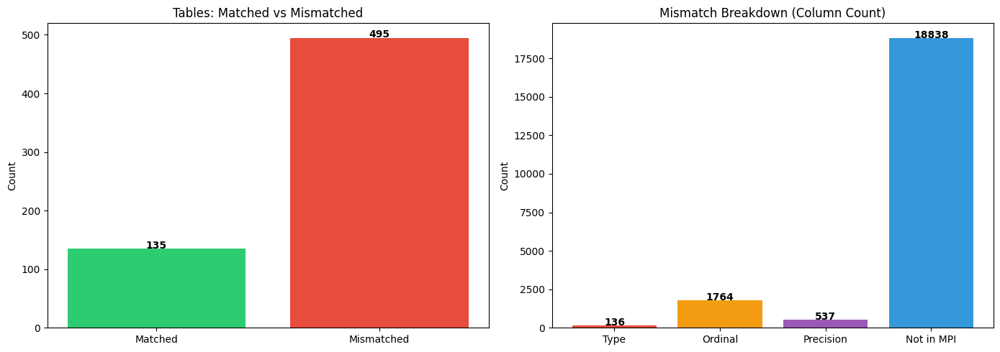

In [0]:
import matplotlib.pyplot as plt

# Collect summary counts
summary_pd = summary_df.toPandas()
mismatched_count = summary_pd['has_any_mismatch'].sum()
matched_count = len(summary_pd) - mismatched_count

# Bar chart of matched vs mismatched
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Chart 1: Matched vs Mismatched tables
axes[0].bar(['Matched', 'Mismatched'], [matched_count, mismatched_count], color=['#2ecc71', '#e74c3c'])
axes[0].set_title('Tables: Matched vs Mismatched')
axes[0].set_ylabel('Count')
for i, v in enumerate([matched_count, mismatched_count]):
    axes[0].text(i, v + 0.3, str(int(v)), ha='center', fontweight='bold')

# Chart 2: Mismatch breakdown
mismatch_types = ['Type', 'Ordinal', 'Precision', 'Not in MPI']
mismatch_counts = [
    summary_pd['type_mismatches'].sum(),
    summary_pd['ordinal_mismatches'].sum(),
    summary_pd['precision_mismatches'].sum(),
    summary_pd['columns_not_in_mpi'].sum()
]
colors = ['#e74c3c', '#f39c12', '#9b59b6', '#3498db']
axes[1].bar(mismatch_types, mismatch_counts, color=colors)
axes[1].set_title('Mismatch Breakdown (Column Count)')
axes[1].set_ylabel('Count')
for i, v in enumerate(mismatch_counts):
    axes[1].text(i, v + 0.3, str(int(v)), ha='center', fontweight='bold')

plt.tight_layout()
display(fig)
plt.close()

In [0]:
import csv
import re
import os

# Mapping dict - used to determine acceptable type matches
mapping_dict = {
    'int': 'int',
    'smallint': 'int',
    'bigint': 'int',
    'varchar': 'string',
    'char': 'string',
    'datetime': 'timestamp',
    'date': 'date',
    'timestamp': 'timestamp',
    'decimal': 'decimal',
    'numeric': 'decimal',
    'short': 'int',
    'long': 'int',
}

# Reverse mapping: normalized type -> Spark SQL type for DDL
normalized_to_spark = {
    'int': 'INT',
    'string': 'STRING',
    'timestamp': 'TIMESTAMP',
    'date': 'DATE',
    'decimal': 'DECIMAL',
}

# Collect MPI metadata for corrections
mpi_corrections = {}
for row in comparison_df.filter(col('type_match') == 'MISMATCH').collect():
    key = (row['csv_table_name'], row['column_name'].lower())
    csv_mapped = row['csv_mapped_type']
    mpi_mapped = row['mpi_mapped_type']
    mpi_original = row['mpi_original_type']
    mpi_precision = row['mpi_numeric_precision']
    mpi_scale = row['mpi_numeric_scale']
    
    # Rule: if CSV says 'string' but MPI says 'int', correct to 'int'
    # Generally: MPI type takes precedence for mismatches
    if mpi_mapped:
        corrected_spark_type = normalized_to_spark.get(mpi_mapped, mpi_mapped.upper())
        if mpi_mapped == 'decimal' and mpi_precision is not None:
            if mpi_scale is not None:
                corrected_spark_type = f'DECIMAL({mpi_precision},{mpi_scale})'
            else:
                corrected_spark_type = f'DECIMAL({mpi_precision})'
        mpi_corrections[key] = corrected_spark_type

# Also collect precision/scale corrections
for row in comparison_df.filter(col('precision_match') == 'MISMATCH').collect():
    key = (row['csv_table_name'], row['column_name'].lower())
    if key not in mpi_corrections:
        mpi_precision = row['mpi_numeric_precision']
        mpi_scale = row['mpi_numeric_scale']
        if mpi_precision is not None:
            if mpi_scale is not None:
                mpi_corrections[key] = f'DECIMAL({mpi_precision},{mpi_scale})'
            else:
                mpi_corrections[key] = f'DECIMAL({mpi_precision})'

print(f"Total corrections to apply: {len(mpi_corrections)}")
for k, v in list(mpi_corrections.items())[:10]:
    print(f"  {k[0]}.{k[1]} -> {v}")

# Now rewrite the CSV with corrected DDLs
def correct_ddl(table_name, ddl_text, corrections_dict):
    """Rewrite DDL column types based on MPI corrections."""
    lines = ddl_text.split('\n')
    corrected_lines = []
    for line in lines:
        stripped = line.strip().rstrip(',')
        trailing_comma = ',' if line.strip().endswith(',') else ''
        # Match column definition
        col_match = re.match(r'^(\s*)(\w+)\s+(\w+(?:\(\d+(?:,\d+)?\))?)(.*)', line)
        if col_match:
            indent = col_match.group(1)
            col_name = col_match.group(2)
            old_type = col_match.group(3)
            rest = col_match.group(4)
            key = (table_name, col_name.lower())
            if key in corrections_dict:
                new_type = corrections_dict[key]
                corrected_line = f"{indent}{col_name} {new_type}{rest}"
                corrected_lines.append(corrected_line)
                continue
        corrected_lines.append(line)
    return '\n'.join(corrected_lines)

# Read original CSV and write corrected version
original_csv_path = '/Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/match_and_update_ddl/definitions (1).csv'
corrected_csv_path = '/Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/match_and_update_ddl/definitions_corrected.csv'

with open(original_csv_path, 'r') as f_in:
    reader = csv.DictReader(f_in)
    fieldnames = reader.fieldnames
    rows = list(reader)

corrected_rows = []
correction_count = 0
bkp_excluded_count = 0
for row in rows:
    table_name = row['table_name'].strip()
    # Exclude _bkp tables from the corrected CSV
    if '_bkp' in table_name.lower():
        bkp_excluded_count += 1
        continue
    original_ddl = row['object_definition']
    corrected_ddl = correct_ddl(table_name, original_ddl, mpi_corrections)
    if corrected_ddl != original_ddl:
        correction_count += 1
    corrected_row = dict(row)
    corrected_row['object_definition'] = corrected_ddl
    corrected_rows.append(corrected_row)
print(f"Excluded _bkp tables from corrected CSV: {bkp_excluded_count}")

with open(corrected_csv_path, 'w', newline='') as f_out:
    writer = csv.DictWriter(f_out, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(corrected_rows)

print(f"\nCorrected CSV saved to: {corrected_csv_path}")
print(f"Tables with DDL corrections: {correction_count} out of {len(rows)}")
print(f"Original CSV unchanged at: {original_csv_path}")

Total corrections to apply: 670
  fcrfactclaimrec_qtrend.fcrsiddya -> INT
  fcrfactclaimrec_qtrend.fcrsiddmo -> INT
  stage_ocr_fcr.fcrsiddya -> INT
  t_ax_drsdimrisksection.drsconsbusctrl_noncons_pcnt -> INT
  t_ax_drsdimrisksection.drsconsbusctrl_cons_pcnt -> INT
  t_ax_drsdimrisksection.drsconsbusctrl_microsme_pcnt -> INT
  t_ax_fcrfactclaimrec.fcrsiddya -> INT
  t_ax_fcrfactclaimrec.fcrsiddmo -> INT
  t_ax_fcrfactclaimrec_qtrend.fcrsiddya -> INT
  t_ax_fcrfactclaimrec_qtrend.fcrsiddmo -> INT
Excluded _bkp tables from corrected CSV: 2

Corrected CSV saved to: /Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/match_and_update_ddl/definitions_corrected.csv
Tables with DDL corrections: 36 out of 668
Original CSV unchanged at: /Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/match_and_update_ddl/definitions (1).csv


In [0]:
import csv
from pyspark.sql import Row
from pyspark.sql.functions import col, lit

# ── Read ACE OZ Build Table Schema Definitions (2).csv ──
ace_csv_path = '/Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/match_and_update_ddl/ACE_OZ_Build_Table_Schema_Definitions (2).csv'
with open(ace_csv_path, 'r') as f:
    reader = csv.DictReader(f)
    ace_csv_rows = list(reader)

print(f"Total tables in ACE OZ Build CSV: {len(ace_csv_rows)}")

# ── Route each table to the intended MPI database ──
ace_table_info = []
for r in ace_csv_rows:
    src = r['source_table'].strip()
    tgt_schema = r.get('target_schema', '').strip()
    intended_db = 'dwh_stage' if tgt_schema.lower() == 'dw_btl_stage_ace_oz_build' else 'DWH_CUAL'
    ace_table_info.append({
        'source_table': src,
        'target_schema': tgt_schema,
        'target_catalog': r.get('target_catalog', '').strip(),
        'target_object_name': r.get('target_object_name', '').strip(),
        'intended_mpi_db': intended_db
    })

# Deduplicate by source_table (same table may appear once)
ace_unique = {}
for t in ace_table_info:
    ace_unique[t['source_table'].lower()] = t

print(f"Distinct ACE OZ Build tables: {len(ace_unique)}")
print(f"  Routed to DWH_CUAL:  {sum(1 for v in ace_unique.values() if v['intended_mpi_db'] == 'DWH_CUAL')}")
print(f"  Routed to dwh_stage: {sum(1 for v in ace_unique.values() if v['intended_mpi_db'] == 'dwh_stage')}")

# ── Use the all-MPI table sets already queried in Cell 5 ──
# all_mpi_table_names = set of all table names across both DBs
# Rebuild per-database sets for precise matching
cual_all_tables = set(
    row['table_name'] for row in cual_all_df.select('table_name').distinct().collect()
)
stage_all_tables = set(
    row['table_name'] for row in stage_all_df.select('table_name').distinct().collect()
)

# ── Check each ACE OZ Build table against its intended MPI database ──
matched_rows = []
no_match_rows = []

for src_lower, info in sorted(ace_unique.items()):
    intended_db = info['intended_mpi_db']
    # Check intended DB first
    if intended_db == 'DWH_CUAL' and src_lower in cual_all_tables:
        found_in = 'DWH_CUAL'
    elif intended_db == 'dwh_stage' and src_lower in stage_all_tables:
        found_in = 'dwh_stage'
    # Fallback: check the OTHER database too
    elif src_lower in cual_all_tables:
        found_in = 'DWH_CUAL (fallback)'
    elif src_lower in stage_all_tables:
        found_in = 'dwh_stage (fallback)'
    else:
        found_in = None

    entry = Row(
        source_table=info['source_table'],
        target_catalog=info['target_catalog'],
        target_schema=info['target_schema'],
        target_object_name=info['target_object_name'],
        intended_mpi_db=intended_db,
        found_in_mpi_db=found_in if found_in else 'NOT FOUND'
    )
    if found_in:
        matched_rows.append(entry)
    else:
        no_match_rows.append(entry)

# ── Display results ──
print(f"\n{'='*90}")
print(f"ACE OZ BUILD CSV vs MPI COVERAGE")
print(f"{'='*90}")
print(f"Total ACE OZ Build tables:     {len(ace_unique)}")
print(f"Matched in MPI:                {len(matched_rows)}")
print(f"NOT found in MPI:              {len(no_match_rows)}")
print(f"{'='*90}")

if no_match_rows:
    print(f"\n=== ACE OZ BUILD TABLES NOT FOUND IN MPI ({len(no_match_rows)}) ===")
    no_match_df = spark.createDataFrame(no_match_rows)
    display(no_match_df.orderBy('source_table'))
else:
    print("\nAll ACE OZ Build tables found in MPI!")

print(f"\n=== ACE OZ BUILD TABLES MATCHED IN MPI ({len(matched_rows)}) ===")
matched_df = spark.createDataFrame(matched_rows)
display(matched_df.orderBy('source_table'))

Total tables in ACE OZ Build CSV: 161
Distinct ACE OZ Build tables: 158
  Routed to DWH_CUAL:  89
  Routed to dwh_stage: 69

ACE OZ BUILD CSV vs MPI COVERAGE
Total ACE OZ Build tables:     158
Matched in MPI:                105
NOT found in MPI:              53

=== ACE OZ BUILD TABLES NOT FOUND IN MPI (53) ===


source_table,target_catalog,target_schema,target_object_name,intended_mpi_db,found_in_mpi_db
adr_stage_combined_monthly_snapshot,axiom_btl_ppd_lpl,dw_btl_stage_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_stage_ace_oz_build`.`adr_stage_combined_monthly_snapshot`,dwh_stage,NOT FOUND
adr_stage_inward_monthly_transaction,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`adr_stage_inward_monthly_transaction`,DWH_CUAL,NOT FOUND
adr_stage_inward_transaction_ey_audit_data_fix,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`adr_stage_inward_transaction_ey_audit_data_fix`,DWH_CUAL,NOT FOUND
adr_stage_inward_transaction_ey_audit_fix,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`adr_stage_inward_transaction_ey_audit_fix`,DWH_CUAL,NOT FOUND
adr_stage_outward_monthly_transaction,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`adr_stage_outward_monthly_transaction`,DWH_CUAL,NOT FOUND
clsclasn,axiom_btl_ppd_lpl,dw_btl_stage_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_stage_ace_oz_build`.`clsclasn`,dwh_stage,NOT FOUND
data_box_number,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`data_box_number`,DWH_CUAL,NOT FOUND
data_business_group,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`data_business_group`,DWH_CUAL,NOT FOUND
data_cost_centre,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`data_cost_centre`,DWH_CUAL,NOT FOUND
data_originating_office,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`data_originating_office`,DWH_CUAL,NOT FOUND



=== ACE OZ BUILD TABLES MATCHED IN MPI (105) ===


source_table,target_catalog,target_schema,target_object_name,intended_mpi_db,found_in_mpi_db
dacdimaccclass,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`dacdimaccclass`,DWH_CUAL,DWH_CUAL
dandimanalysis,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`dandimanalysis`,DWH_CUAL,DWH_CUAL
daudimauthclass,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`daudimauthclass`,DWH_CUAL,DWH_CUAL
dbrdimbroker,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`dbrdimbroker`,DWH_CUAL,DWH_CUAL
dcadimcashalloc,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`dcadimcashalloc`,DWH_CUAL,DWH_CUAL
dccdimcostcentre,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`dccdimcostcentre`,DWH_CUAL,DWH_CUAL
dcgdimcostcentregroup,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`dcgdimcostcentregroup`,DWH_CUAL,DWH_CUAL
dcldimclaim,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`dcldimclaim`,DWH_CUAL,DWH_CUAL
dcpdimcurrencyprofile,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`dcpdimcurrencyprofile`,DWH_CUAL,DWH_CUAL
dcsdimclass,axiom_btl_ppd_lpl,dw_btl_ace_oz_build,`axiom_btl_ppd_lpl`.`dw_btl_ace_oz_build`.`dcsdimclass`,DWH_CUAL,DWH_CUAL


In [0]:
from pyspark.sql import Row
from pyspark.sql.functions import col, lit

# ── Collect the 53 unmatched table names from cell 11 ──
unmatched_names = [r['source_table'].lower() for r in no_match_rows]
print(f"Unmatched tables to check in dwh_stage.dbo: {len(unmatched_names)}")

# ── Query dwh_stage.dbo for these specific tables ──
tbl_str = ','.join([f"'{t}'" for t in unmatched_names])
stage_check_query = f"""
SELECT lower(table_name) AS table_name, table_type
FROM information_schema.tables
WHERE table_schema = 'dbo' AND lower(table_name) IN ({tbl_str})
"""

stage_found_df = mpi_dwh_stage(stage_check_query)
stage_found_set = set(row['table_name'] for row in stage_found_df.collect())

print(f"Found in dwh_stage.dbo: {len(stage_found_set)} out of {len(unmatched_names)}")

# ── Classify each unmatched table ──
result_rows = []
for r in no_match_rows:
    src = r['source_table'].lower()
    found = 'YES' if src in stage_found_set else 'NO'
    result_rows.append(Row(
        source_table=r['source_table'],
        target_schema=r['target_schema'],
        intended_mpi_db=r['intended_mpi_db'],
        found_in_dwh_stage_dbo=found
    ))

result_df = spark.createDataFrame(result_rows)

# ── Show tables FOUND in dwh_stage.dbo ──
found_df = result_df.filter(col('found_in_dwh_stage_dbo') == 'YES')
still_missing_df = result_df.filter(col('found_in_dwh_stage_dbo') == 'NO')

print(f"\n{'='*90}")
print(f"53 UNMATCHED TABLES — RECHECK IN dwh_stage.dbo")
print(f"{'='*90}")
print(f"Now FOUND in dwh_stage.dbo:      {found_df.count()}")
print(f"Still NOT found anywhere:         {still_missing_df.count()}")
print(f"{'='*90}")

if found_df.count() > 0:
    print(f"\n=== TABLES NOW MATCHED IN dwh_stage.dbo ({found_df.count()}) ===")
    display(found_df.orderBy('source_table'))

if still_missing_df.count() > 0:
    print(f"\n=== TABLES STILL NOT FOUND ({still_missing_df.count()}) ===")
    display(still_missing_df.orderBy('source_table'))

Unmatched tables to check in dwh_stage.dbo: 53
Found in dwh_stage.dbo: 0 out of 53

53 UNMATCHED TABLES — RECHECK IN dwh_stage.dbo
Now FOUND in dwh_stage.dbo:      0
Still NOT found anywhere:         53

=== TABLES STILL NOT FOUND (53) ===


source_table,target_schema,intended_mpi_db,found_in_dwh_stage_dbo
adr_stage_combined_monthly_snapshot,dw_btl_stage_ace_oz_build,dwh_stage,NO
adr_stage_inward_monthly_transaction,dw_btl_ace_oz_build,DWH_CUAL,NO
adr_stage_inward_transaction_ey_audit_data_fix,dw_btl_ace_oz_build,DWH_CUAL,NO
adr_stage_inward_transaction_ey_audit_fix,dw_btl_ace_oz_build,DWH_CUAL,NO
adr_stage_outward_monthly_transaction,dw_btl_ace_oz_build,DWH_CUAL,NO
clsclasn,dw_btl_stage_ace_oz_build,dwh_stage,NO
data_box_number,dw_btl_ace_oz_build,DWH_CUAL,NO
data_business_group,dw_btl_ace_oz_build,DWH_CUAL,NO
data_cost_centre,dw_btl_ace_oz_build,DWH_CUAL,NO
data_originating_office,dw_btl_ace_oz_build,DWH_CUAL,NO


In [0]:
from pyspark.sql import Row
from pyspark.sql.functions import col, lit

# ── JDBC helper for arbitrary MPI database ──
def mpi_query(database_name, sql_query):
    username = "MS_DB_MTTC"
    password = dbutils.secrets.get(
        scope="zxlc0291thefppue2key02",
        key="frameodsppdonpremsql"
    )
    jdbc_url = (
        f"jdbc:sqlserver://100.122.42.4:30000;"
        f"database={database_name};user={username};password={password};"
        f"encrypt=true;trustServerCertificate=true"
    )
    return (
        spark.read.format("jdbc")
        .option("url", jdbc_url)
        .option("driver", "com.microsoft.sqlserver.jdbc.SQLServerDriver")
        .option("user", username)
        .option("password", password)
        .option("sendStringParametersAsUnicode", False)
        .option("query", sql_query)
        .load()
    )

# ── 53 unmatched table names ──
unmatched_names = [r['source_table'].lower() for r in no_match_rows]
tbl_str = ','.join([f"'{t}'" for t in unmatched_names])
print(f"Checking {len(unmatched_names)} unmatched tables across 5 MPI databases...\n")

# ── Databases to check ──
check_databases = ['SwanRepRestore', 'Actuarial_Data_Mart', 'DWH_STAND_DATA']

# ── Query each database ──
db_found = {}  # db_name -> set of found table names
for db_name in check_databases:
    try:
        query = f"""
        SELECT lower(table_name) AS table_name, table_type
        FROM information_schema.tables
        WHERE table_schema = 'dbo' AND lower(table_name) IN ({tbl_str})
        """
        found_df = mpi_query(db_name, query)
        found_set = set(row['table_name'] for row in found_df.collect())
        db_found[db_name] = found_set
        print(f"  {db_name:25s} -> {len(found_set)} tables found")
    except Exception as e:
        db_found[db_name] = set()
        print(f"  {db_name:25s} -> ERROR: {str(e)[:120]}")

# ── Build result: for each unmatched table, show which DB(s) it exists in ──
result_rows = []
for r in no_match_rows:
    src = r['source_table'].lower()
    found_in_dbs = [db for db, tbl_set in db_found.items() if src in tbl_set]
    result_rows.append(Row(
        source_table=r['source_table'],
        target_schema=r['target_schema'],
        originally_intended_db=r['intended_mpi_db'],
        found_in_databases=', '.join(found_in_dbs) if found_in_dbs else 'NOT FOUND',
        match_count=len(found_in_dbs)
    ))

result_df = spark.createDataFrame(result_rows)
now_found_df = result_df.filter(col('match_count') > 0)
still_missing_df = result_df.filter(col('match_count') == 0)

print(f"\n{'='*90}")
print(f"53 UNMATCHED TABLES — RECHECK ACROSS 5 MPI DATABASES")
print(f"  classification | dwh_stand | ods | swanreprestore | stand_data")
print(f"{'='*90}")
print(f"Now FOUND in at least one DB:   {now_found_df.count()}")
print(f"Still NOT found anywhere:        {still_missing_df.count()}")
print(f"{'='*90}")

if now_found_df.count() > 0:
    print(f"\n=== TABLES NOW MATCHED ({now_found_df.count()}) ===")
    display(now_found_df.orderBy('source_table'))

if still_missing_df.count() > 0:
    print(f"\n=== TABLES STILL NOT FOUND ({still_missing_df.count()}) ===")
    display(still_missing_df.orderBy('source_table'))

Checking 53 unmatched tables across 5 MPI databases...

  SwanRepRestore            -> 0 tables found
  Actuarial_Data_Mart       -> 24 tables found
  DWH_STAND_DATA            -> 4 tables found

53 UNMATCHED TABLES — RECHECK ACROSS 5 MPI DATABASES
  classification | dwh_stand | ods | swanreprestore | stand_data
Now FOUND in at least one DB:   28
Still NOT found anywhere:        25

=== TABLES NOW MATCHED (28) ===


source_table,target_schema,originally_intended_db,found_in_databases,match_count
adr_stage_combined_monthly_snapshot,dw_btl_stage_ace_oz_build,dwh_stage,Actuarial_Data_Mart,1
adr_stage_inward_monthly_transaction,dw_btl_ace_oz_build,DWH_CUAL,Actuarial_Data_Mart,1
adr_stage_inward_transaction_ey_audit_data_fix,dw_btl_ace_oz_build,DWH_CUAL,Actuarial_Data_Mart,1
adr_stage_inward_transaction_ey_audit_fix,dw_btl_ace_oz_build,DWH_CUAL,Actuarial_Data_Mart,1
adr_stage_outward_monthly_transaction,dw_btl_ace_oz_build,DWH_CUAL,Actuarial_Data_Mart,1
dim_policy_section,dw_btl_ace_oz_build,DWH_CUAL,Actuarial_Data_Mart,1
dim_reserving_class,dw_btl_ace_oz_build,DWH_CUAL,Actuarial_Data_Mart,1
import_policy_reserving_class,dw_btl_ace_oz_build,DWH_CUAL,Actuarial_Data_Mart,1
impreinsrecexframe_data,dw_btl_stage_ace_oz_build,dwh_stage,DWH_STAND_DATA,1
inward_quarterly_loss_development_snapshot,dw_btl_ace_oz_build,DWH_CUAL,Actuarial_Data_Mart,1



=== TABLES STILL NOT FOUND (25) ===


source_table,target_schema,originally_intended_db,found_in_databases,match_count
clsclasn,dw_btl_stage_ace_oz_build,dwh_stage,NOT FOUND,0
data_box_number,dw_btl_ace_oz_build,DWH_CUAL,NOT FOUND,0
data_business_group,dw_btl_ace_oz_build,DWH_CUAL,NOT FOUND,0
data_cost_centre,dw_btl_ace_oz_build,DWH_CUAL,NOT FOUND,0
data_originating_office,dw_btl_ace_oz_build,DWH_CUAL,NOT FOUND,0
data_policy_type,dw_btl_ace_oz_build,DWH_CUAL,NOT FOUND,0
data_risk_code,dw_btl_ace_oz_build,DWH_CUAL,NOT FOUND,0
dim_platform_adm,dw_btl_ace_oz_build,DWH_CUAL,NOT FOUND,0
disdiminsured,dw_btl_ace_oz_build,DWH_CUAL,NOT FOUND,0
inlinsdline,dw_btl_stage_ace_oz_build,dwh_stage,NOT FOUND,0


In [0]:
from pyspark.sql import Row
from pyspark.sql.functions import col

# ── 53 unmatched table names (not found in DWH_CUAL or dwh_stage) ──
unmatched_names = [r['source_table'].lower() for r in no_match_rows]
tbl_str = ','.join([f"'{t}'" for t in unmatched_names])
print(f"Tables to locate: {len(unmatched_names)}")

# ── Search only in these 3 targeted MPI databases (all schemas) ──
target_databases = ['SwanRepRestore', 'Actuarial_Data_Mart', 'DWH_STAND_DATA']
print(f"Databases to search: {target_databases}\n")

db_results = {}
for db_name in target_databases:
    try:
        query = f"""
        SELECT lower(table_name) AS table_name, table_schema, table_type
        FROM information_schema.tables
        WHERE lower(table_name) IN ({tbl_str})
        """
        found_df = mpi_query(db_name, query)
        found_rows = found_df.collect()
        if found_rows:
            db_results[db_name] = [(r['table_name'], r['table_schema'], r['table_type']) for r in found_rows]
            print(f"  {db_name:30s} -> {len(found_rows)} tables found")
        else:
            print(f"  {db_name:30s} -> 0 tables found")
    except Exception as e:
        print(f"  {db_name:30s} -> ERROR: {str(e)[:120]}")

# ── Build location_map: table_name -> list of (db, schema, type) ──
location_map = {}
for db_name, entries in db_results.items():
    for tbl, schema, ttype in entries:
        location_map.setdefault(tbl, []).append((db_name, schema, ttype))

# ── Build result for all 53 unmatched tables ──
result_rows = []
for r in no_match_rows:
    src = r['source_table'].lower()
    locations = location_map.get(src, [])
    if locations:
        for db_name, schema, ttype in locations:
            result_rows.append(Row(
                source_table=r['source_table'],
                target_schema=r['target_schema'],
                mpi_database=db_name,
                mpi_schema=schema,
                mpi_table_type=ttype,
                status='FOUND'
            ))
    else:
        result_rows.append(Row(
            source_table=r['source_table'],
            target_schema=r['target_schema'],
            mpi_database='—',
            mpi_schema='—',
            mpi_table_type='—',
            status='NOT FOUND IN ANY DB'
        ))

final_df = spark.createDataFrame(result_rows)
found_final = final_df.filter(col('status') == 'FOUND')
missing_final = final_df.filter(col('status') != 'FOUND')

print(f"\n{'='*90}")
print(f"SEARCH: SwanRepRestore | Actuarial_Data_Mart | DWH_STAND_DATA")
print(f"{'='*90}")
print(f"Tables located:            {found_final.select('source_table').distinct().count()}")
print(f"Tables still not found:    {missing_final.select('source_table').distinct().count()}")
print(f"{'='*90}")

if found_final.count() > 0:
    print(f"\n=== TABLES FOUND — LOCATION DETAILS ===")
    display(found_final.orderBy('source_table', 'mpi_database'))

if missing_final.count() > 0:
    print(f"\n=== TABLES NOT FOUND ===")
    display(missing_final.select('source_table', 'target_schema').orderBy('source_table'))

Tables to locate: 53
Databases to search: ['SwanRepRestore', 'Actuarial_Data_Mart', 'DWH_STAND_DATA']

  SwanRepRestore                 -> 3 tables found
  Actuarial_Data_Mart            -> 24 tables found
  DWH_STAND_DATA                 -> 4 tables found

SEARCH: SwanRepRestore | Actuarial_Data_Mart | DWH_STAND_DATA
Tables located:            31
Tables still not found:    22

=== TABLES FOUND — LOCATION DETAILS ===


source_table,target_schema,mpi_database,mpi_schema,mpi_table_type,status
adr_stage_combined_monthly_snapshot,dw_btl_stage_ace_oz_build,Actuarial_Data_Mart,dbo,BASE TABLE,FOUND
adr_stage_inward_monthly_transaction,dw_btl_ace_oz_build,Actuarial_Data_Mart,dbo,BASE TABLE,FOUND
adr_stage_inward_transaction_ey_audit_data_fix,dw_btl_ace_oz_build,Actuarial_Data_Mart,dbo,BASE TABLE,FOUND
adr_stage_inward_transaction_ey_audit_fix,dw_btl_ace_oz_build,Actuarial_Data_Mart,dbo,BASE TABLE,FOUND
adr_stage_outward_monthly_transaction,dw_btl_ace_oz_build,Actuarial_Data_Mart,dbo,BASE TABLE,FOUND
clsclasn,dw_btl_stage_ace_oz_build,SwanRepRestore,Classification,VIEW,FOUND
dim_policy_section,dw_btl_ace_oz_build,Actuarial_Data_Mart,dbo,BASE TABLE,FOUND
dim_reserving_class,dw_btl_ace_oz_build,Actuarial_Data_Mart,dbo,BASE TABLE,FOUND
import_policy_reserving_class,dw_btl_ace_oz_build,Actuarial_Data_Mart,dbo,BASE TABLE,FOUND
impreinsrecexframe_data,dw_btl_stage_ace_oz_build,DWH_STAND_DATA,dbo,BASE TABLE,FOUND



=== TABLES NOT FOUND ===


source_table,target_schema
data_box_number,dw_btl_ace_oz_build
data_business_group,dw_btl_ace_oz_build
data_cost_centre,dw_btl_ace_oz_build
data_originating_office,dw_btl_ace_oz_build
data_policy_type,dw_btl_ace_oz_build
data_risk_code,dw_btl_ace_oz_build
dim_platform_adm,dw_btl_ace_oz_build
disdiminsured,dw_btl_ace_oz_build
stage_lookup_risk,dw_btl_stage_ace_oz_build
stage_lookup_riskseq_1,dw_btl_stage_ace_oz_build


In [0]:
import re
from pyspark.sql import Row
from pyspark.sql.functions import lower, col, expr, when, lit
from pyspark.sql import functions as F
from functools import reduce

# ══════════════════════════════════════════════════════════════════════════════
# Step 1: Categorise found tables → EDW (drop) vs non-EDW (compare)
# ══════════════════════════════════════════════════════════════════════════════
edw_drop_tables = set()
non_edw_routing = {}  # table_name_lower -> (primary_db, primary_schema)

for tbl, locations in location_map.items():
    non_edw = [(db, sch, tt) for db, sch, tt in locations
               if not db.upper().startswith('EDW')]
    if non_edw:
        bau = ['_BAU', '_April_Monthend', '_feb_monthend', '_Monthend_bkp', '_TAD', '_FULL_LOAD']
        primary = next(((db, sch) for db, sch, _ in non_edw
                        if not any(db.endswith(s) for s in bau)), 
                       (non_edw[0][0], non_edw[0][1]))
        non_edw_routing[tbl] = primary
    else:
        edw_drop_tables.add(tbl)

print(f"=== TABLES TO DROP (EDW only): {len(edw_drop_tables)} ===")
for t in sorted(edw_drop_tables):
    print(f"  {t}")
print(f"\n=== TABLES TO COMPARE (non-EDW): {len(non_edw_routing)} ===")
for t, (db, sch) in sorted(non_edw_routing.items()):
    print(f"  {t:55s} -> {db}.{sch}")

# ══════════════════════════════════════════════════════════════════════════════
# Step 2: Query MPI columns grouped by (database, schema)
# ══════════════════════════════════════════════════════════════════════════════
db_schema_tables = {}
for tbl, (db, sch) in non_edw_routing.items():
    db_schema_tables.setdefault((db, sch), []).append(tbl)

new_mpi_frames = []
for (db, sch), tables in db_schema_tables.items():
    tbl_str = ','.join([f"'{t}'" for t in tables])
    q = f"""
    SELECT lower(table_name) AS table_name, column_name, data_type,
           ordinal_position AS mpi_ordinal_position,
           numeric_precision AS mpi_numeric_precision,
           numeric_scale AS mpi_numeric_scale
    FROM information_schema.columns
    WHERE table_schema = '{sch}' AND lower(table_name) IN ({tbl_str})
    """
    print(f"\nQuerying {db}.{sch} for {len(tables)} tables...")
    df = mpi_query(db, q).withColumn('mpi_database', lit(db)).withColumn('mpi_schema_name', lit(sch))
    print(f"  -> {df.count()} columns, {df.select('table_name').distinct().count()} tables")
    new_mpi_frames.append(df)

new_mpi_meta_df = reduce(lambda a, b: a.unionByName(b), new_mpi_frames)
print(f"\nCombined new MPI columns: {new_mpi_meta_df.count()}")
print(f"Distinct tables: {new_mpi_meta_df.select('table_name').distinct().count()}")

# ══════════════════════════════════════════════════════════════════════════════
# Step 3: Parse DDL from ACE OZ Build CSV for non-EDW tables
# ══════════════════════════════════════════════════════════════════════════════
non_edw_set = set(non_edw_routing.keys())
ace_parsed = []
for row in ace_csv_rows:
    src = row['source_table'].strip().lower()
    if src not in non_edw_set:
        continue
    cols = parse_ddl(row['generated_ddl'].strip())
    for c in cols:
        ace_parsed.append(Row(
            source_table=src, column_name=c['column_name'],
            csv_data_type=c['data_type'], csv_ordinal_position=c['ordinal_position'],
            csv_numeric_precision=c['numeric_precision'], csv_numeric_scale=c['numeric_scale']
        ))
ace_parsed_df = spark.createDataFrame(ace_parsed)
print(f"\nParsed ACE OZ DDL columns: {ace_parsed_df.count()}")

# ══════════════════════════════════════════════════════════════════════════════
# Step 4: Normalize types and compare
# ══════════════════════════════════════════════════════════════════════════════
type_map = {
    'int': 'int', 'smallint': 'int', 'bigint': 'int', 'short': 'int', 'long': 'int',
    'varchar': 'string', 'char': 'string', 'nvarchar': 'string', 'nchar': 'string',
    'datetime': 'timestamp', 'datetime2': 'timestamp', 'date': 'date', 'timestamp': 'timestamp',
    'decimal': 'decimal', 'numeric': 'decimal', 'float': 'double', 'real': 'double',
}
mpi_map_e = "CASE " + " ".join([f"WHEN lower(data_type)='{k}' THEN '{v}'" for k,v in type_map.items()]) + " ELSE lower(data_type) END"
csv_map_e = "CASE " + " ".join([f"WHEN lower(csv_data_type)='{k}' THEN '{v}'" for k,v in type_map.items()]) + " ELSE lower(csv_data_type) END"

new_mpi_norm = new_mpi_meta_df.withColumn('mpi_mapped_type', expr(mpi_map_e))
ace_norm = ace_parsed_df.withColumn('csv_mapped_type', expr(csv_map_e))

new_comparison_df = ace_norm.alias('a').join(
    new_mpi_norm.alias('m'),
    (lower(col('a.source_table')) == lower(col('m.table_name'))) &
    (lower(col('a.column_name')) == lower(col('m.column_name'))),
    how='left'
).select(
    col('a.source_table'), col('m.table_name').alias('mpi_table_name'),
    col('m.mpi_database'), col('m.mpi_schema_name'),
    col('a.column_name'),
    col('a.csv_data_type').alias('csv_original_type'), col('a.csv_mapped_type'),
    col('m.data_type').alias('mpi_original_type'), col('m.mpi_mapped_type'),
    col('a.csv_ordinal_position'), col('m.mpi_ordinal_position'),
    col('a.csv_numeric_precision'), col('m.mpi_numeric_precision'),
    col('a.csv_numeric_scale'), col('m.mpi_numeric_scale')
).withColumn('type_match',
    when(col('mpi_mapped_type').isNull(), lit('NO MPI MATCH'))
    .when(lower(col('csv_mapped_type')) == lower(col('mpi_mapped_type')), lit('MATCH'))
    .otherwise(lit('MISMATCH'))
).withColumn('ordinal_match',
    when(col('mpi_ordinal_position').isNull(), lit('NO MPI MATCH'))
    .when(col('csv_ordinal_position') == col('mpi_ordinal_position'), lit('MATCH'))
    .otherwise(lit('MISMATCH'))
)

# ══════════════════════════════════════════════════════════════════════════════
# Step 5: Display mismatches
# ══════════════════════════════════════════════════════════════════════════════
new_type_mis = new_comparison_df.filter(col('type_match') == 'MISMATCH')
new_ord_mis = new_comparison_df.filter(col('ordinal_match') == 'MISMATCH')
new_no_mpi = new_comparison_df.filter(col('type_match') == 'NO MPI MATCH')

print(f"\n{'='*90}")
print(f"COMPARISON: ACE OZ Build DDL vs non-EDW MPI databases")
print(f"{'='*90}")
print(f"Total comparison rows: {new_comparison_df.count()}")
print(f"Type mismatches:       {new_type_mis.count()}")
print(f"Ordinal mismatches:    {new_ord_mis.count()}")
print(f"Columns not in MPI:    {new_no_mpi.count()}")

if new_type_mis.count() > 0:
    print(f"\n=== DATA TYPE MISMATCHES ({new_type_mis.count()}) ===")
    display(new_type_mis.select(
        'source_table', 'mpi_database', 'mpi_schema_name', 'column_name',
        'csv_original_type', 'csv_mapped_type', 'mpi_original_type', 'mpi_mapped_type'
    ).orderBy('source_table', 'column_name'))

if new_ord_mis.count() > 0:
    print(f"\n=== ORDINAL POSITION MISMATCHES ({new_ord_mis.count()}) ===")
    display(new_ord_mis.select(
        'source_table', 'mpi_database', 'column_name',
        'csv_ordinal_position', 'mpi_ordinal_position'
    ).orderBy('source_table', 'csv_ordinal_position'))

if new_no_mpi.count() > 0:
    print(f"\n=== COLUMNS NOT FOUND IN MPI ({new_no_mpi.count()}) ===")
    display(new_no_mpi.select('source_table', 'column_name', 'csv_original_type')
            .orderBy('source_table', 'column_name'))

=== TABLES TO DROP (EDW only): 6 ===
  data_box_number
  data_business_group
  data_cost_centre
  data_originating_office
  data_policy_type
  data_risk_code

=== TABLES TO COMPARE (non-EDW): 33 ===
  adr_stage_combined_monthly_snapshot                     -> Actuarial_Data_Mart.dbo
  adr_stage_inward_monthly_transaction                    -> Actuarial_Data_Mart.dbo
  adr_stage_inward_transaction_ey_audit_data_fix          -> Actuarial_Data_Mart.dbo
  adr_stage_inward_transaction_ey_audit_fix               -> Actuarial_Data_Mart.dbo
  adr_stage_outward_monthly_transaction                   -> Actuarial_Data_Mart.dbo
  clsclasn                                                -> SwanRepRestore.Classification
  dim_policy_section                                      -> Actuarial_Data_Mart.dbo
  dim_reserving_class                                     -> Actuarial_Data_Mart.dbo
  disdiminsured                                           -> DWH_CUAL_APRIL_MONTHEND.dbo
  import_policy_reserving_

source_table,mpi_database,mpi_schema_name,column_name,csv_original_type,csv_mapped_type,mpi_original_type,mpi_mapped_type
adr_stage_outward_monthly_transaction,Actuarial_Data_Mart,dbo,ACCIDENT_DATE,DATE,date,datetime,timestamp
dim_policy_section,Actuarial_Data_Mart,dbo,declaration_number,STRING,string,int,int
inward_quarterly_loss_development_snapshot,Actuarial_Data_Mart,dbo,SYNDICATE,STRING,string,int,int
inward_quarterly_loss_development_snapshot,Actuarial_Data_Mart,dbo,YEAR_AC,STRING,string,int,int
stage_accruals,Actuarial_Data_Mart,dbo,SYNDICATE,STRING,string,int,int
stage_accruals,Actuarial_Data_Mart,dbo,YEAR_AC,STRING,string,int,int
stage_inward_premium,Actuarial_Data_Mart,dbo,syndicate,STRING,string,int,int
stage_inward_premium,Actuarial_Data_Mart,dbo,year_ac,STRING,string,int,int
stage_inward_premium_history,Actuarial_Data_Mart,dbo,SYNDICATE,STRING,string,int,int
stage_inward_premium_history,Actuarial_Data_Mart,dbo,YEAR_AC,STRING,string,int,int



=== ORDINAL POSITION MISMATCHES (4) ===


source_table,mpi_database,column_name,csv_ordinal_position,mpi_ordinal_position
inlinsdline,SwanRepRestore,inlReinsdFromSIDinl,27,29
inlinsdline,SwanRepRestore,inlReinsdFromSIDinl,27,29
inlinsdline,SwanRepRestore,inlChannelENUM,28,30
inlinsdline,SwanRepRestore,inlChannelENUM,28,30



=== COLUMNS NOT FOUND IN MPI (3) ===


source_table,column_name,csv_original_type
adr_stage_combined_monthly_snapshot,ADR_STAGE_INWARD_MONTHLY_TRANSACTION_SOURCE_KEY,INT
inlinsdline,inlCoLeadInd,VARCHAR
inlinsdline,inlCoLeadInd,VARCHAR


In [0]:
import csv
import re

# ══════════════════════════════════════════════════════════════════════════════
# Step 1: Collect ALL corrections — original (DWH_CUAL/dwh_stage) + new (non-EDW)
# ══════════════════════════════════════════════════════════════════════════════
normalized_to_spark = {
    'int': 'INT', 'string': 'STRING', 'timestamp': 'TIMESTAMP',
    'date': 'DATE', 'decimal': 'DECIMAL',
}

# --- Original corrections from cells 6-10 (keyed by csv_table_name) ---
orig_type_corr = {}   # (csv_table_name, col_lower) -> corrected_type
orig_ordinals = {}    # (csv_table_name, col_lower) -> mpi_ordinal

for row in comparison_df.filter(col('type_match') == 'MISMATCH').collect():
    key = (row['csv_table_name'], row['column_name'].lower())
    csv_m, mpi_m = row['csv_mapped_type'], row['mpi_mapped_type']
    if csv_m in ('decimal', 'double') or mpi_m in ('decimal', 'double'):
        continue  # preserve decimal/double
    if mpi_m:
        orig_type_corr[key] = normalized_to_spark.get(mpi_m, mpi_m.upper())

for row in comparison_df.filter(col('mpi_ordinal_position').isNotNull()).collect():
    key = (row['csv_table_name'], row['column_name'].lower())
    orig_ordinals[key] = row['mpi_ordinal_position']

# --- New corrections from cell 15 (keyed by base/source_table name) ---
new_type_corr = {}    # (base_name, col_lower) -> corrected_type
new_ordinals = {}     # (base_name, col_lower) -> mpi_ordinal

for row in new_comparison_df.filter(col('type_match') == 'MISMATCH').collect():
    key = (row['source_table'].lower(), row['column_name'].lower())
    csv_m, mpi_m = row['csv_mapped_type'], row['mpi_mapped_type']
    if csv_m in ('decimal', 'double') or mpi_m in ('decimal', 'double'):
        continue
    if mpi_m:
        new_type_corr[key] = normalized_to_spark.get(mpi_m, mpi_m.upper())

for row in new_comparison_df.filter(col('mpi_ordinal_position').isNotNull()).collect():
    key = (row['source_table'].lower(), row['column_name'].lower())
    new_ordinals[key] = row['mpi_ordinal_position']

print(f"Original type corrections (DWH_CUAL/dwh_stage):  {len(orig_type_corr)}")
print(f"Original ordinal entries:                         {len(orig_ordinals)}")
print(f"New type corrections (non-EDW found):             {len(new_type_corr)}")
print(f"New ordinal entries:                              {len(new_ordinals)}")
print(f"EDW tables to drop:                               {len(edw_drop_tables)}")

# ══════════════════════════════════════════════════════════════════════════════
# Step 2: DDL correction function — type fixes + ordinal reorder
# ══════════════════════════════════════════════════════════════════════════════
def correct_ddl_final(table_name, base_name, ddl_text,
                      o_type, o_ord, n_type, n_ord):
    """Apply type corrections and reorder columns per MPI ordinal position."""
    match = re.search(r'(CREATE TABLE[^(]*\()(.+?)(\)\s*(?:USING.*))',
                      ddl_text, re.DOTALL | re.IGNORECASE)
    if not match:
        return ddl_text
    prefix, col_block, suffix = match.group(1), match.group(2), match.group(3)

    columns = []
    for line in col_block.strip().split('\n'):
        stripped = line.strip().rstrip(',')
        if not stripped:
            continue
        cm = re.match(r'^(\w+)\s+(.*)', stripped)
        if cm:
            cname, rest = cm.group(1), cm.group(2)
            okey = (table_name, cname.lower())
            nkey = (base_name, cname.lower())

            # Type correction: try original key, then base key
            correction = o_type.get(okey) or n_type.get(nkey)
            if correction:
                tm = re.match(r'^(\w+(?:\(\d+(?:,\d+)?\))?)(.*)', rest)
                if tm:
                    rest = correction + tm.group(2)

            # Ordinal: try original key, then base key
            ordinal = o_ord.get(okey) or n_ord.get(nkey, 99999)
            columns.append((cname, rest, ordinal))

    columns.sort(key=lambda x: x[2])
    col_lines = []
    for i, (nm, rst, _) in enumerate(columns):
        comma = ',' if i < len(columns) - 1 else ''
        col_lines.append(f"  {nm} {rst}{comma}")
    return prefix + '\n' + '\n'.join(col_lines) + '\n' + suffix

# ══════════════════════════════════════════════════════════════════════════════
# Step 3: Read definitions (1).csv, apply corrections, drop EDW tables
# ══════════════════════════════════════════════════════════════════════════════
def1_path = '/Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/match_and_update_ddl/definitions (1).csv'
with open(def1_path, 'r') as f:
    reader = csv.DictReader(f)
    fieldnames = reader.fieldnames
    def1_all = list(reader)

corrected_rows = []
correction_count = 0
edw_dropped = []
bkp_excluded = 0

for row in def1_all:
    tname = row['table_name'].strip()
    base = get_mpi_table_name(tname)  # strips ace_oz_ / t_ax_ / xli_ods_

    # Skip _bkp tables
    if '_bkp' in tname.lower():
        bkp_excluded += 1
        continue

    # Drop EDW-only tables
    if base in edw_drop_tables:
        edw_dropped.append(tname)
        continue

    original_ddl = row['object_definition']
    corrected_ddl = correct_ddl_final(
        tname, base, original_ddl,
        orig_type_corr, orig_ordinals,
        new_type_corr, new_ordinals
    )
    if corrected_ddl != original_ddl:
        correction_count += 1
    corrected_row = dict(row)
    corrected_row['object_definition'] = corrected_ddl
    corrected_rows.append(corrected_row)

# ══════════════════════════════════════════════════════════════════════════════
# Step 4: Write output
# ══════════════════════════════════════════════════════════════════════════════
out_path = '/Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/match_and_update_ddl/definitions_corrected_v2.csv'
with open(out_path, 'w', newline='') as f_out:
    writer = csv.DictWriter(f_out, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(corrected_rows)

print(f"\n{'='*90}")
print(f"FINAL CORRECTED DEFINITIONS CSV")
print(f"{'='*90}")
print(f"Source:                    definitions (1).csv ({len(def1_all)} tables)")
print(f"_bkp tables excluded:      {bkp_excluded}")
print(f"EDW tables dropped:        {len(edw_dropped)}")
for t in edw_dropped:
    print(f"  {t}")
print(f"Tables with DDL fixes:     {correction_count}")
print(f"Total tables in output:    {len(corrected_rows)}")
print(f"Output saved to:           {out_path}")
print(f"\n⚠ Decimal and double types were NOT changed — awaiting your confirmation.")

Original type corrections (DWH_CUAL/dwh_stage):  48
Original ordinal entries:                         8040
New type corrections (non-EDW found):             13
New ordinal entries:                              721
EDW tables to drop:                               6

FINAL CORRECTED DEFINITIONS CSV
Source:                    definitions (1).csv (668 tables)
_bkp tables excluded:      2
EDW tables dropped:        6
  data_box_number
  data_business_group
  data_cost_centre
  data_originating_office
  data_policy_type
  data_risk_code
Tables with DDL fixes:     637
Total tables in output:    660
Output saved to:           /Workspace/Users/manasvi.pipariya@axaxl.com/data_compare/match_and_update_ddl/definitions_corrected_v2.csv

⚠ Decimal and double types were NOT changed — awaiting your confirmation.
